# Ejercicio 4: Mapas de Coropletas de la Encuesta CASEN 2013

Eduardo Graells-Garrido (egraells@udd.cl), Diego Caro (dcaro@udd.cl).

En este ejercicio definiremos una función para visualizar datos geoespaciales utilizando *mapas de coropletas*. Esta técnica de visualización en inglés se llama [Choropleth Map](https://en.wikipedia.org/wiki/Choropleth_map), y es utilizada comúnmente para mostrar distribuciones de datos en mapas, adjudicando uno o más valores dentro de una escala a cada área del mapa. 

Como este tipo de visualización colorea cada área del mapa de acuerdo a su valor dentro de una distribución específica, es posible encontrar patrones geográficos. 

Los ejemplos más comunes son los mapas electorales y mapas de distribución de ingreso (o similares). Aquí hay un ejemplo de un mapa de coropletas por áreas censales de Santiago, mostrando la distribución de grupos socioeconómicos:

![](img/03_choropleth_stgo.jpg)

Ahora bien, hay que tener cuidado cuando se elaboran estos mapas porque debemos asegurarnos que las variables a analizar en distintas áreas sean relativas. Por ejemplo, no es lo mismo comparar cantidad de votos totales por un candidato en comunas, sino que deben compararse los porcentajes. Estas problemáticas las trabajaremos a lo largo del curso :)

## Bibliotecas y Configuración

Como siempre, lo primero que haremos será cargar todas las herramientas necesarias para ejecutar este notebook.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import numpy as np

# ésta es una biblioteca interna que usamos en el taller. está incluida en el repositorio, en la carpeta carpynter
from carpynter import choropleth

# estilo de los gráficos, configurado por seaborn
sns.set(context='poster', style='ticks', palette='Accent', font_scale=1.1)

# muestra los gráficos en línea
%matplotlib inline

## Comunas de Santiago

Queremos visualizar datos geoespaciales, y por ende lo primero que necesitamos es cargar la geografía. Para ello cargaremos los bordes comunales de acuerdo al [archivo Shapefile](https://es.wikipedia.org/wiki/Shapefile) de comunas que dispone la [Biblioteca del Congreso Nacional](https://www.bcn.cl/siit/mapas_vectoriales/index_html). Lo cargaremos usando GeoPandas:

In [2]:
municipalities = gpd.read_file('./input/shapefile_comunas/division_comunal.shp', crs={'init': 'epsg:5361'})
municipalities.head()

,NOM_REG,NOM_PROV,NOM_COM,SHAPE_LENG,DIS_ELEC,CIR_SENA,COD_COMUNA,SHAPE_Le_1,SHAPE_Area,geometry
0,Región de La Araucanía,Malleco,Ercilla,170675.595438,48,14,9204,170675.595706,4.979025e+08,"POLYGON ((190393.2198999999 5794527.3661, 1904..."
1,Región de La Araucanía,Malleco,Lonquimay,346907.195437,49,14,9205,346907.195899,3.932854e+09,"POLYGON ((294265.5926999999 5781748.8701, 2943..."
2,Región de La Araucanía,Malleco,Los Sauces,169844.122286,48,14,9206,169844.122239,8.519730e+08,"POLYGON ((155495.1031999998 5804765.8096, 1555..."
3,Región de La Araucanía,Malleco,Lumaco,227705.219204,48,14,9207,227705.218806,1.112643e+09,"POLYGON ((159561.5301000001 5778741.6606, 1597..."
4,Región de La Araucanía,Malleco,Purén,137030.480474,48,14,9208,137030.480353,4.654760e+08,"POLYGON ((145272.5931000002 5804247.7066, 1453..."


Recordemos que el sistema de coordenadas [EPSG:5361](https://epsg.io/5361) que utiliza este archivo está en metros, no en latitud/longitud. Esto permite realizar operaciones como estimar el área de cada comuna:

In [3]:
municipalities['area_km2'] = municipalities.area / 1000000

Hagamos un mapa de coropletas donde las áreas más grandes se vean más claras, utilizando una escala de colores cuantitativa llamada [`magma`](https://cran.r-project.org/web/packages/viridis/vignettes/intro-to-viridis.html).

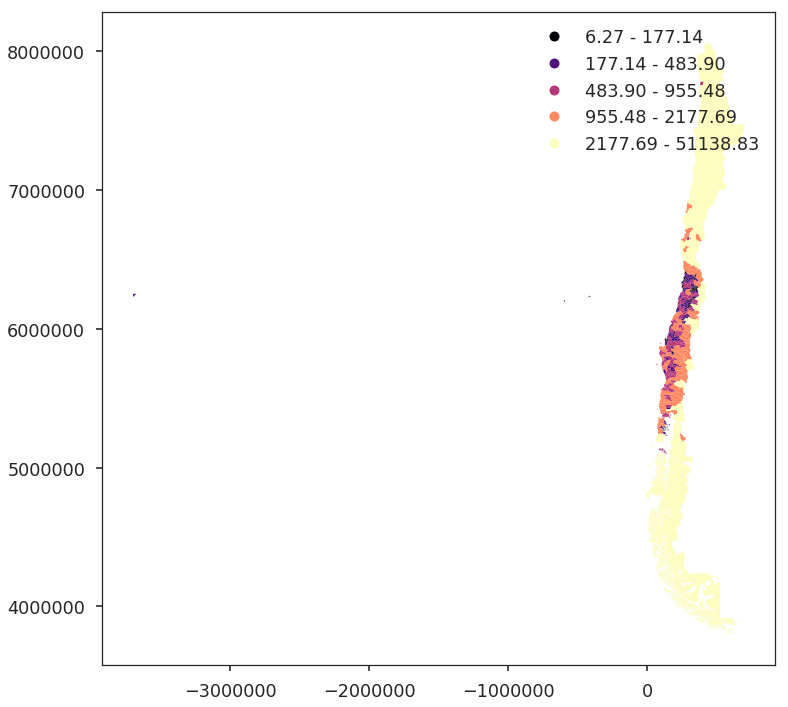

In [4]:
municipalities.plot(figsize=(20,12), column='area_km2', scheme='quantiles', cmap='magma', legend=True)

En este notebook analizaremos el área urbana de Santiago. Para eso necesitamos filtrar las comunas que pertenecen a la Región Metropolitana:

In [5]:
metropolitan_region = municipalities[municipalities.NOM_REG == 'Región Metropolitana de Santiago']
metropolitan_region.shape

(52, 11)

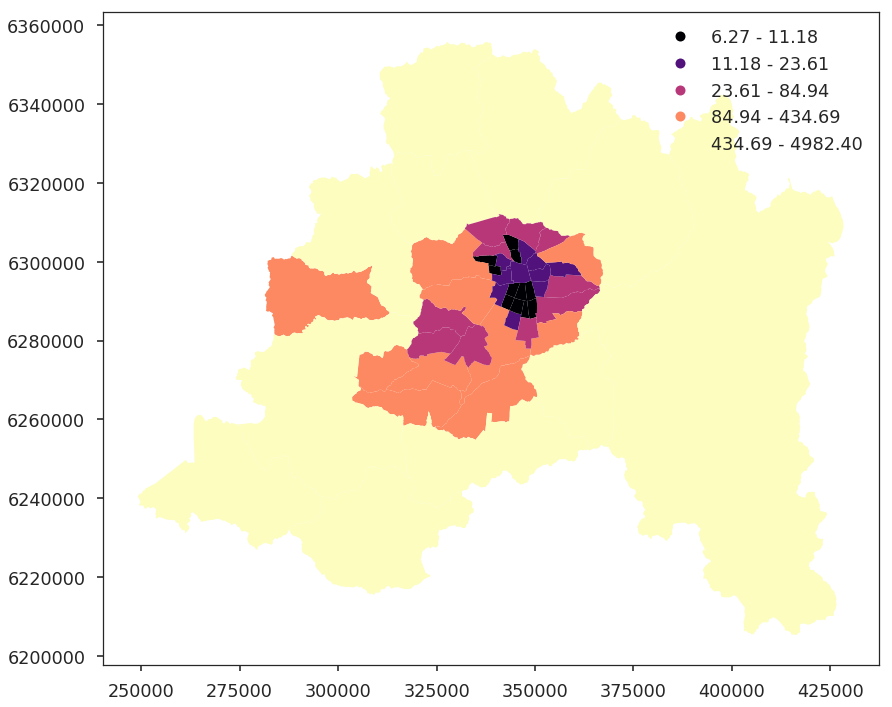

In [6]:
metropolitan_region.plot(figsize=(20,12), column='area_km2', scheme='quantiles', cmap='magma', legend=True)

## Urban Areas

Para poder analizar el área urbana necesitamos otro Shapefile, también disponible en la BCN. Lo cargamos aquí:

In [7]:
urban_areas = gpd.read_file('./input/urban_areas/', crs={'init': 'epsg:5361'})
urban_areas.sample(5)

,NOMBRE,TIPO_AREA,SHAPE_Leng,SHAPE_Area,geometry
150,Mulchen,Ciudad,9691.031515,3.928739e+06,"POLYGON ((212756.2778000003 5820169.2714, 2130..."
181,La Cruz,Ciudad,2593.653428,2.527070e+05,"POLYGON ((291413.2554000001 6365443.2741, 2915..."
187,La Calera,Ciudad,26878.954984,7.123652e+06,"POLYGON ((292958.0055999998 6370916.1219, 2931..."
356,San Jose del Carmen,Aldea,2825.422842,2.309358e+05,"POLYGON ((282079.8359000003 6177349.676, 28208..."
118,Nipas,Pueblo,5077.489786,6.354426e+05,"POLYGON ((182719.1162 5943706.998, 182928.0333..."


Notamos que tiene una columna `NOMBRE` que seguramente permitirá identificar el área que nos interesa:

In [8]:
urban_areas[urban_areas.NOMBRE == 'Santiago'].shape

(1, 5)

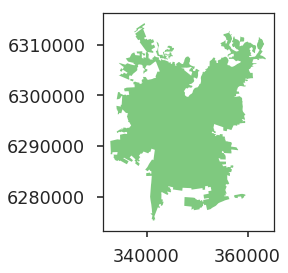

In [9]:
urban_areas[urban_areas.NOMBRE == 'Santiago'].plot()

Guardemos la geometría que nos interesa. Filtraremos el GeoDataframe `urban_areas` buscando el área que se llama `Santiago`. De su columna `geometry` extraeremos sus valores, y de ellos, nos quedaremos con el primero. Esto es necesario porque aunque sabemos que el dataframe solamente contiene una geometría, el método entrega una columna completa, independiente de cuantos elementos tenga ésta.

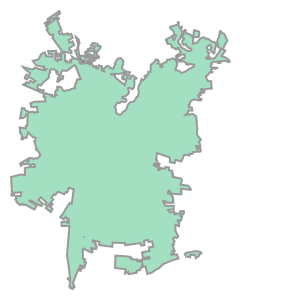

In [10]:
stgo_area = urban_areas[urban_areas.NOMBRE == 'Santiago'].geometry.values[0]
stgo_area

Ahora reasignemos la geometría de las comunas de la región metropolitana para que contengan solamente la intersección con esta área que hemos guardado:

In [11]:
metropolitan_region['geometry'] = metropolitan_region.geometry.map(lambda x: x.intersection(stgo_area))

/home/egraells/.virtualenvs/jupyter/lib/python3.5/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


Filtremos las intersecciones que no tienen nada, y que por tanto tienen área cero o nula:

In [12]:
urban_municipalities = metropolitan_region[metropolitan_region.area > 0].copy()
urban_municipalities['area_km2'] = urban_municipalities.area / 1000000

Noten que, debido a que las superficies cambiaron, hemos vuelto a calcular el área. Ahora dibujémosla:

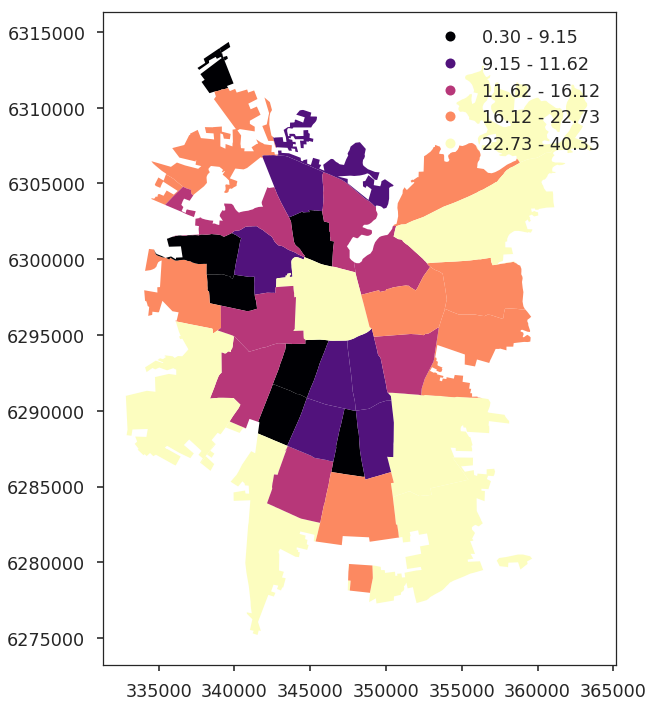

In [13]:
urban_municipalities.plot(figsize=(20,12), column='area_km2', scheme='quantiles', cmap='magma', legend=True)

Bien. Ahora convertiremos este GeoDataframe al sistema de coordenadas latitud/longitud, conocido como `EPSG:4326`:

In [14]:
urban_municipalities = urban_municipalities.to_crs({'init': 'epsg:4326'})

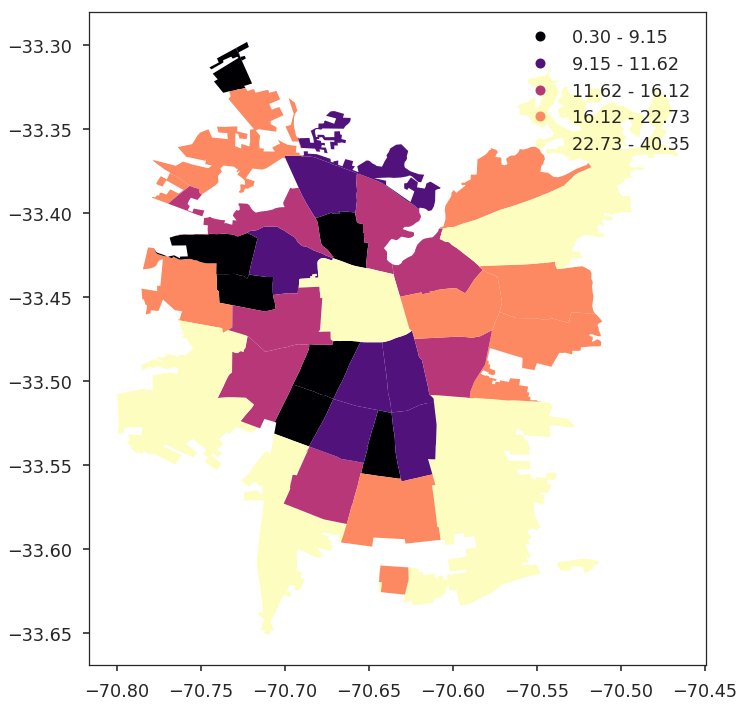

In [15]:
urban_municipalities.plot(figsize=(20,12), column='area_km2', scheme='quantiles', cmap='magma', legend=True)

## Coropletas con Contexto

Utilicemos el método `choropleth` de nuestra herramienta `carpynter` (por cierto, está inspirada en el pájaro [carpintero negro](https://es.wikipedia.org/wiki/Campephilus_magellanicus) magallánico :)):

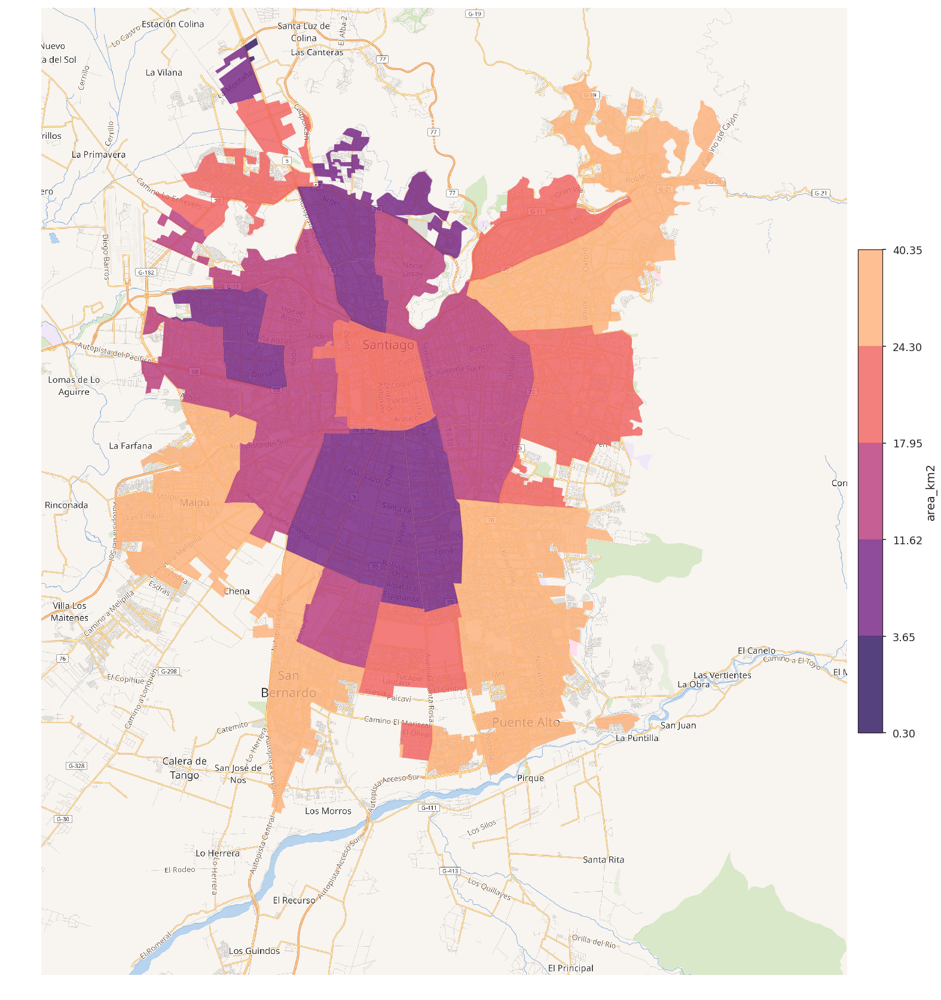

In [16]:
choropleth(urban_municipalities, column='area_km2', scheme='fisher_jenks', palette='magma', figsize=28, alpha=0.8)

Al mostrar el contexto del mapa podemos darnos cuenta que los datos de áreas urbanas de la BCN están desactualizados con respecto a los bordes urbanos de la ciudad.

También podemos mostrar datos categóricos. Utilizando la paleta de colores HUSL, en el que asignaremos un color distinto a cada comuna:

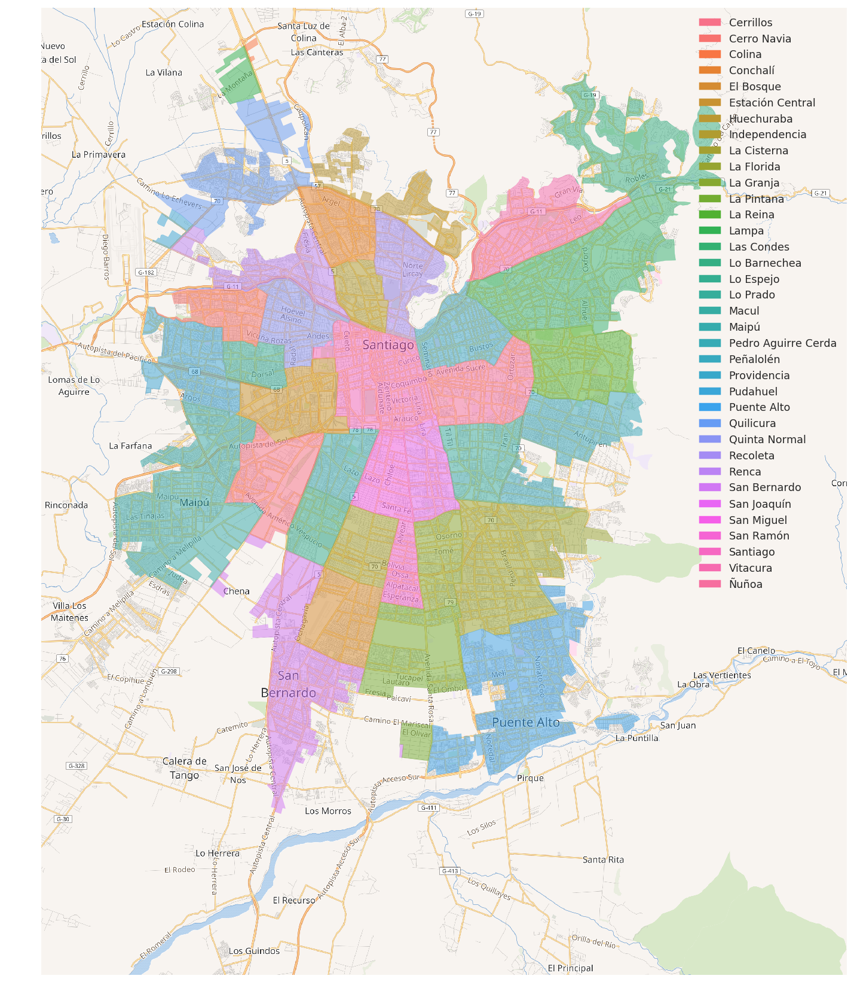

In [17]:
choropleth(urban_municipalities, column='NOM_COM', scheme='categorical', palette='husl', figsize=28, alpha=0.5)

Como son tantas comunas es prácticamente imposible tener colores que se _perciban_ distintos entre cada una. Pero ese es un problema que atacaremos más adelante en el taller.

## Encuesta CASEN 2013: Satisfacción con la Vida e Ingreso

Carguemos y analicemos la Encuesta CASEN, en su versión 2013 (descargable [aquí](http://www.ministeriodesarrollosocial.gob.cl/basededatoscasen.php)). Esta encuesta se realizada cada dos años, y [Wikipedia la describe de la siguiente manera](https://es.wikipedia.org/wiki/Encuesta_Casen):

> Esta encuesta es mandatada por el Ministerio de Desarrollo Social de Chile ex Ministerio de Planificación y Cooperación (Mideplan) y se caracteriza por medir las condiciones socioeconómicas de los hogares del país, en términos de acceso a la salud, la educación, el trabajo y a las condiciones de la vivienda. Proporciona datos como la situación de pobreza e indigencia de la población y como está distribuido el ingreso. También entrega antecedentes sobre la cobertura y perfil de los beneficiarios de los programas sociales. Permite orientar el diseño para nuevos proyectos y de modificaciones en los sistemas de retribución de los beneficios para mejorar la focalización de aquellos que funcionan como carácter selectivo.

> La encuesta Casen además es ampliamente utilizada por otros Ministerios y servicios públicos para el diseño y evaluación de sus políticas y programas. Además diversas universidades, centros académicos y otras entidades son usuarios de la información proporcionada por la encuesta.

> La información que proporciona la encuesta, constituye un antecedente básico para focalizar el gasto social y sirve de manera sustantiva al proceso de descentralización de la gestión del Estado, permite obtener resultados a nivel regional y para un número muy significativo de las comunas del país.

Nos enfocamos en la versión 2013 porque incluye una pregunta que nos interesa analizar: **Considerando todas las cosas, ¿Qué tan satisfecho(a) estás con tu vida?**

La respuesta a esa pregunta está codificada en una escala de 1 (totalmente insatisfecho(a)) a 10 (totalmente satisfecho(a)).

Comencemos :)

In [18]:
casen = pd.read_csv('./input/2013_casen_survey/Casen2013.csv.gz', sep=',', encoding='iso-8859-1')
casen.sample(3)

/home/egraells/.virtualenvs/jupyter/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2698: DtypeWarning: Columns (16,18,25,27,38,51,114,234,286,312,316,332,349,360,369) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,folio,o,region,comuna,zona,pco1,sexo,edad,ecivil,...,esc,educ,depen,activ,indmat,indsan,calgobviv,iai,iae,hacinamiento
7761,7761,1.107108e+10,6,1,1107,1,2,2,36,1,...,10.0,3,NaN,1.0,1,1,1,1,1,1
47674,47674,5.502101e+10,2,5,5502,1,3,2,1,7,...,NaN,0,NaN,NaN,1,1,1,1,1,1
76918,76918,7.106200e+10,1,7,7106,1,1,2,46,6,...,0.0,0,NaN,1.0,1,1,1,2,1,1


In [19]:
list(casen.columns)

['Unnamed: 0',
 'folio',
 'o',
 'region',
 'comuna',
 'zona',
 'pco1',
 'sexo',
 'edad',
 'ecivil',
 'h5l',
 'h5h',
 'pareja',
 'nucleo',
 'pco2',
 'h8',
 'h8esp',
 'h9',
 'h9esp',
 'e1',
 'e2a',
 'e2b',
 'e2c',
 'e3',
 'e4',
 'e4esp',
 'e5',
 'e5esp',
 'e6a',
 'e6b',
 'e6c',
 'e6d',
 'e7',
 'e8nom',
 'e8dir',
 'e8com',
 'e8com_cod',
 'e8rbd',
 'e8dv',
 'e8depen',
 'e8te',
 'e9',
 'e10',
 'e11a',
 'e11b',
 'e11c',
 'e11d',
 'e11e',
 'e12a',
 'e12b1',
 'e12b2',
 'e12esp',
 'e13pbu',
 'e13pbt',
 'e13pbd',
 'e13pbm',
 'e13bu',
 'e13bt',
 'e13bd',
 'e13bm',
 'e13bpc',
 'e13mu',
 'e13mt',
 'e13md',
 'e13mm',
 'e14a',
 'e14b',
 'e15',
 'e16',
 'e17t1',
 'e18m1',
 'e18p1',
 'e17t2',
 'e18m2',
 'e18p2',
 'e0',
 'o1',
 'o2',
 'o3',
 'o4',
 'o5',
 'o6',
 'o7r1',
 'o7r2',
 'o8',
 'o9a',
 'oficio4',
 'oficio1',
 'o9b',
 'o10',
 'o11',
 'o12',
 'o13',
 'o14',
 'o15',
 'o16',
 'o17',
 'o18',
 'o19',
 'o20',
 'o21',
 'rama4_sub',
 'rama1_sub',
 'o22',
 'o23',
 'rama4',
 'rama1',
 'o24',
 'o25',
 'o26

Wow, es una encuesta enorme. ¡Tiene muchísima información! Sin embargo, gran parte de las preguntas tiene un identificador que no conocemos. Lo mismo para las preguntas que nos interesan.

Para eso podemos acceder al [Libro de Códigos](http://observatorio.ministeriodesarrollosocial.gob.cl/documentos/Libro_de_Codigos_Casen_2013_Base_Principal_Metodologia_Nueva.pdf) de la encuesta. Allí sale que la pregunta de satisfacción tiene código `r20`, que tiene un factor de expansión propio (aquí hay una [breve explicación de qué es un factor de expansión](http://www.redatam.org/redchl/mds/casen/WebHelp/informaci_n_casen/factores_de_expancion.htm)), y que cada comuna tiene un código propio.

Antes de hacer el análisis, construyamos un diccionario con los identificadores de las comunas, ya que analizaremos la satisfacción en el área urbana de Santiago:

In [20]:
name_map = dict(zip([13101, 13102, 13103
    ,13104,13105,13106,13107,13108,13109,13110,13111,13112,13113,13114,13115,13116,13117,13118,13119,13120,13121,13122,13123
    ,13124,13125,13126,13127,13128,13129,13130,13131,13132,13201,13202,13203,13301,13302,13303,13401,13402,13403,13404,13501,
    13502, 13503, 13504, 13505, 13601, 13602, 13603, 13604, 13605],
    map(lambda x: x.title(), ['Santiago', 'Cerrillos', 'Cerro Navia', 'Conchalí', 'El Bosque', 'Estación Central', 'Huechuraba', 'Independencia', 'La Cisterna', 'La Florida', 'La Granja', 'La Pintana', 'La Reina', 'Las Condes', 'Lo Barnechea', 
                          'Lo Espejo', 'Lo Prado', 'Macul', 'Maipú', 'Ñuñoa', 'Pedro Aguirre Cerda', 'Peñalolén', 'Providencia', 
                          'Pudahuel', 'Quilicura', 'Quinta Normal', 'Recoleta', 'Renca', 'San Joaquín', 'San Miguel',
                          'San Ramón', 'Vitacura', 'Puente Alto', 'Pirque', 'San José de Maipo', 'Colina',
                          'Lampa', 'Tiltil', 'San Bernardo', 'Buin', 'Calera de Tango', 'Paine',
                          'Melipilla', 'Alhué', 'Curacaví', 'María Pinto', 'San Pedro', 'Talagante',
                          'El Monte', 'Isla de Maipo', 'Padre Hurtado', 'Peñaflor'
])))
name_map

{13101: 'Santiago',
 13102: 'Cerrillos',
 13103: 'Cerro Navia',
 13104: 'Conchalí',
 13105: 'El Bosque',
 13106: 'Estación Central',
 13107: 'Huechuraba',
 13108: 'Independencia',
 13109: 'La Cisterna',
 13110: 'La Florida',
 13111: 'La Granja',
 13112: 'La Pintana',
 13113: 'La Reina',
 13114: 'Las Condes',
 13115: 'Lo Barnechea',
 13116: 'Lo Espejo',
 13117: 'Lo Prado',
 13118: 'Macul',
 13119: 'Maipú',
 13120: 'Ñuñoa',
 13121: 'Pedro Aguirre Cerda',
 13122: 'Peñalolén',
 13123: 'Providencia',
 13124: 'Pudahuel',
 13125: 'Quilicura',
 13126: 'Quinta Normal',
 13127: 'Recoleta',
 13128: 'Renca',
 13129: 'San Joaquín',
 13130: 'San Miguel',
 13131: 'San Ramón',
 13132: 'Vitacura',
 13201: 'Puente Alto',
 13202: 'Pirque',
 13203: 'San José De Maipo',
 13301: 'Colina',
 13302: 'Lampa',
 13303: 'Tiltil',
 13401: 'San Bernardo',
 13402: 'Buin',
 13403: 'Calera De Tango',
 13404: 'Paine',
 13501: 'Melipilla',
 13502: 'Alhué',
 13503: 'Curacaví',
 13504: 'María Pinto',
 13505: 'San Pedro',
 

In [21]:
# solamente RM
casen = casen[casen.region == 13].copy()
casen.shape

(36680, 601)

Acabamos de filtrar las observaciones para la RM, y ahora crearemos una columna con los nombres de comuna que nos interesan:

In [22]:
casen['municipality'] = casen['comuna'].map(lambda x: name_map[x])
casen['municipality'].value_counts()

Maipú                  2968
Puente Alto            2882
La Florida             1729
San Bernardo           1476
Peñalolén              1398
Pudahuel               1251
Las Condes             1163
La Pintana             1105
Santiago                961
Quilicura               945
Cerro Navia             900
Recoleta                894
El Bosque               885
La Granja               878
Providencia             850
Renca                   816
Conchalí                794
Ñuñoa                   785
Estación Central        772
Macul                   675
Lo Prado                642
Pedro Aguirre Cerda     640
Quinta Normal           603
Melipilla               555
San Ramón               543
Talagante               504
Peñaflor                486
Lo Espejo               485
Vitacura                485
San Joaquín             476
Lo Barnechea            469
Lampa                   454
Huechuraba              449
Cerrillos               448
Independencia           439
La Cisterna         

Por otro lado, al ver el libro de códigos observamos que la pregunta `r20` va de 1 a 10, pero que puede tener valor 99 cuando no se responde. Veamos:

In [23]:
casen['r20'].describe()

count    14467.000000
mean         8.382526
std          9.278511
min          1.000000
25%          6.000000
50%          8.000000
75%         10.000000
max         99.000000
Name: r20, dtype: float64

El problema de que el valor sea 99 es que no es un valor nulo, por lo que distorsiona los resultados. Entonces, tendremos que filtrar las observaciones de la encuesta, dejando las que pertenezcan a las comunas urbanas, que tengan una respuesta válida, y adicionalmente, que sean respondidas por adultos:

In [24]:
casen = casen[(casen.municipality.isin(urban_municipalities['NOM_COM'])) 
              & (casen.r20 <= 10)
              & (casen.edad >= 18)].copy()
casen.shape

(12197, 602)

¿Cómo quedó el factor?

In [25]:
casen['r20'].describe()

count    12197.000000
mean         7.468804
std          2.180284
min          1.000000
25%          6.000000
50%          8.000000
75%         10.000000
max         10.000000
Name: r20, dtype: float64

Mucho mejor. Vemos que la satisfacción promedio es prácticamente 7.5, y que la media es 8. Aparentemente vivimos en una ciudad muy satisfecha con su vida, ya que la escala es de 1 a 10.

El siguiente gráfico muestra la distribución de la variable:

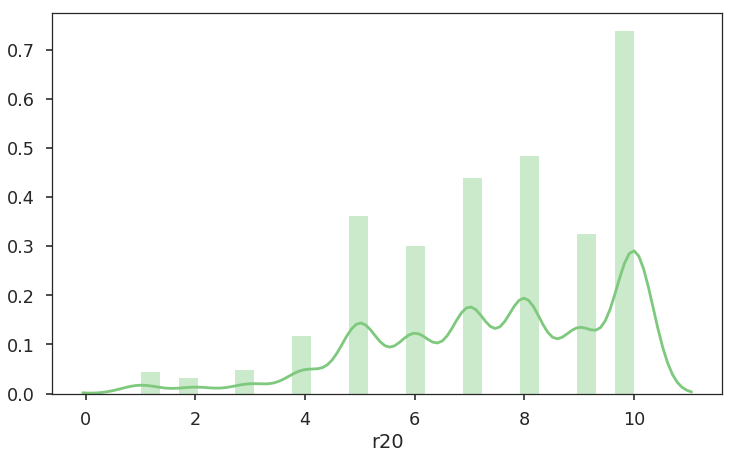

In [26]:
plt.figure(figsize=(12,7))
sns.distplot(casen.r20)

Wow, parece que la gente en Chile está muy satisfecha con su vida :) Noten como la distribución tiene a valores cercanos a 10, y sobretodo mayores a 5.

Veamos como se distribuye esta variable en cada municipalidad, utilizando el método `FacetGrid` de seaborn que vimos en el ejercicio anterior:

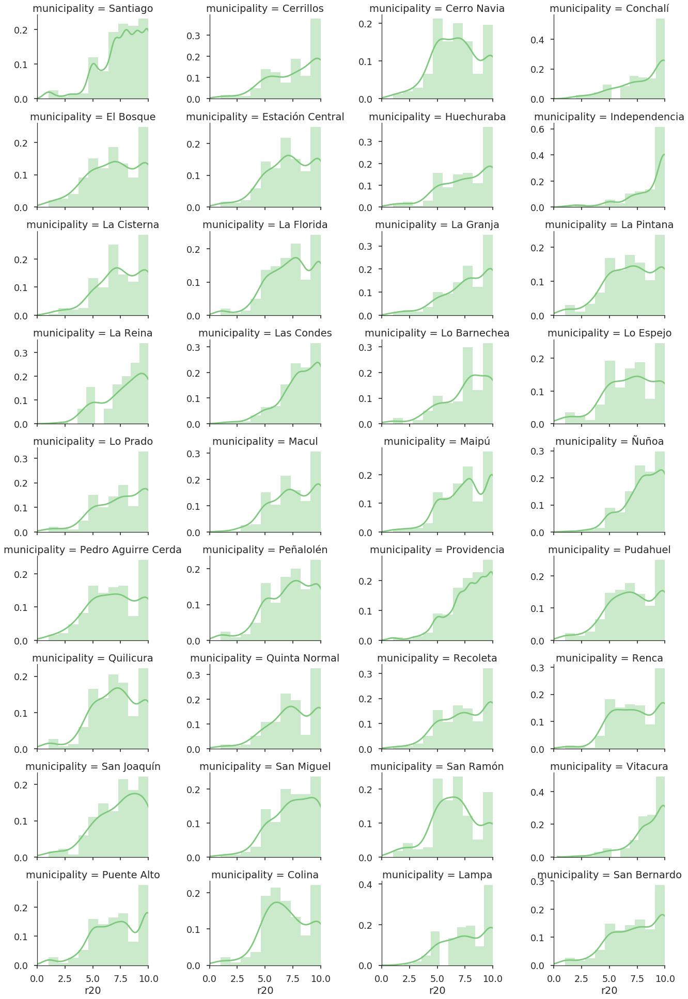

In [27]:
g = sns.FacetGrid(data=casen, col='municipality', col_wrap=4, aspect=1.5, size=3, sharey=False)
g.map(sns.distplot, 'r20', bins=10)
g.set(xlim=[0,10])
g.add_legend()

¡Son gráficos muy bonitos! Y podemos encontrar historias. ¿Cuáles son las formas características de las comunas?¿Cuáles son las comunas mayoritariamente (in)felices?

Podríamos responder esas preguntas mirando los gráficos, pero no estaríamos haciendo lo correcto, porque no sabemos qué tan representativa es cada observación. Según el libro de códigos, hay dos factores de expansión: uno general (todas las variables) y uno específico para la pregunta `r20`: 

In [28]:
casen.loc[:,('r20', 'expr_r20', 'expr')].sample(5)

,r20,expr_r20,expr
161455,8.0,497.0,292
172425,8.0,NaN,134
167489,7.0,196.0,128
184551,10.0,NaN,124
171577,9.0,644.0,219


Haremos lo siguiente: queremos el promedio de satisfacción por comuna. Por tanto, primero expandiremos el valor reportado en `r20`:

In [29]:
casen['adjusted_r20'] = casen.r20 * casen.expr_r20

Luego sumaremos el total de población considerada en cada municipalidad:

In [30]:
casen_municipality_exp = casen.groupby('municipality').aggregate({'expr_r20': 'sum'})
casen_municipality_exp.head()

,expr_r20
municipality,
Cerrillos,82869.0
Cerro Navia,107214.0
Colina,55916.0
Conchalí,84330.0
El Bosque,123270.0


Después calcularemos la suma total de satisfacción ajustada, que dividiremos por el total de población. El resultado será almacenado en la columna `exp_average`:

In [31]:
satisfaction = casen.groupby('municipality').aggregate({'adjusted_r20': 'sum'}).join(casen_municipality_exp)
satisfaction['exp_average'] = satisfaction['adjusted_r20'] / satisfaction['expr_r20']
satisfaction.head()

,adjusted_r20,expr_r20,exp_average
municipality,,,
Cerrillos,641107.0,82869.0,7.736391
Cerro Navia,751386.0,107214.0,7.008283
Colina,428153.0,55916.0,7.657075
Conchalí,676105.0,84330.0,8.017372
El Bosque,882563.0,123270.0,7.159593


Agreguemos una columna llamada `life_satisfaction` a nuestro GeoDataframe de municipalidades, que contenga el valor calculado por cada municipalidad:

In [32]:
urban_municipalities = urban_municipalities.join(satisfaction['exp_average'], on='NOM_COM')

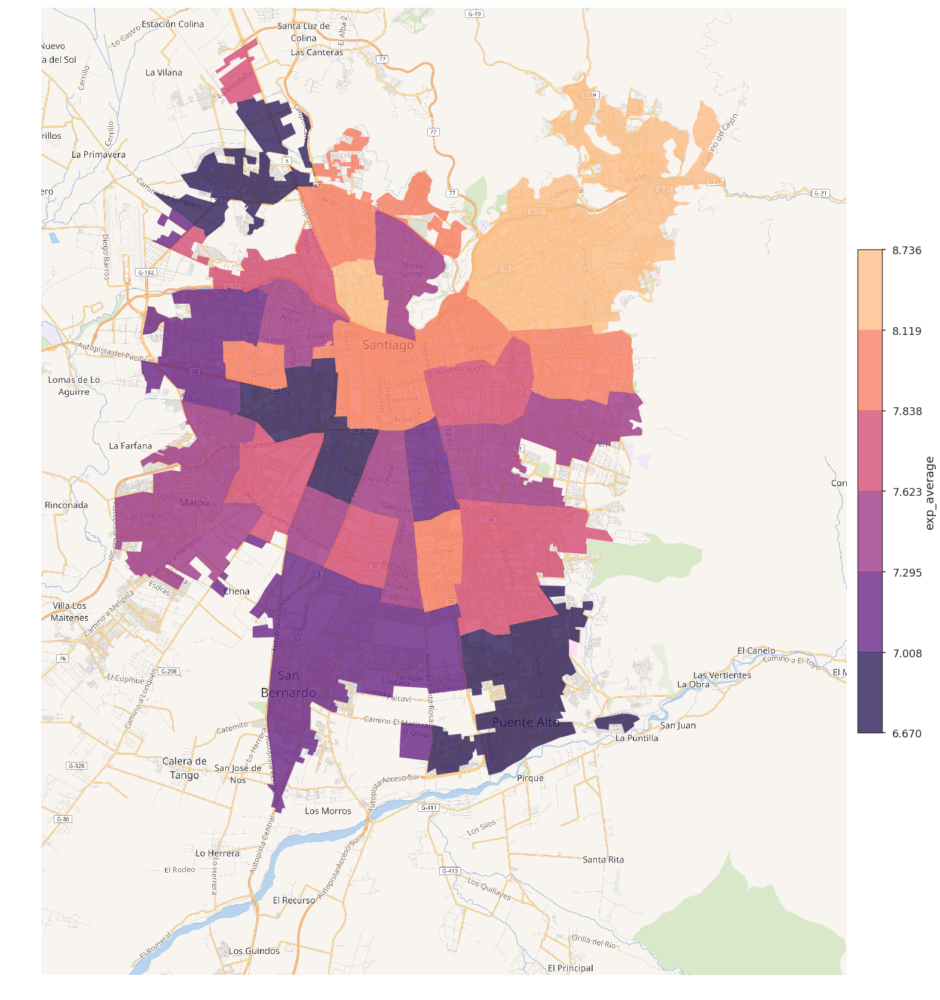

In [33]:
choropleth(urban_municipalities, figsize=28, column='exp_average', palette='magma', n_colors=6)

¡Que lindo mapa! 

Ahora bien, **algo no cuadra**: los promedios son "altos". De hecho, gracias a eso se dice que gran parte de los chilenos [está satisfecho con su vida](http://www.plataformaurbana.cl/archive/2015/02/28/encuesta-casen-en-dos-anos-suben-de-63-a-70-los-chilenos-que-estan-felices-con-su-vida/). Sin embargo, Chile también es un país con [preocupantes índices de depresión](http://www.elmostrador.cl/agenda-pais/vida-en-linea/2017/02/23/chile-se-ubica-por-sobre-el-promedio-mundial-en-indice-de-depresion-segun-nuevo-informe-de-la-oms/) y de [estrés](https://www.publimetro.cl/cl/nacional/2016/10/27/80-chilenos-viven-alto-nivel-estres.html). Entonces, ¿cómo interpretar estos números?

Proponemos que la manera correcta de hacerlo es ver los índices de satisfacción de manera relativa. Lo que importa no es si alguien dice 7 de 10, sino qué tan arriba o abajo del promedio alguien dice estar satisfecho. 

Para poder calcular estos valores relativos utilizaremos la fórmula de [puntaje estándar](https://es.wikipedia.org/wiki/Unidad_tipificada) o $z-score$:

$$z = \frac{x - \mu}{\sigma}$$ 

El puntaje estándar nos dice qué tanto se aleja un valor del promedio, en términos de la desviación estándar del dataset. Lo podemos calcular así:

In [34]:
urban_municipalities['z_satisfaction'] = ((urban_municipalities['exp_average'] - urban_municipalities['exp_average'].mean()) /
                                        urban_municipalities['exp_average'].std())
urban_municipalities['z_satisfaction'].sample(5)

334   -1.318391
291    0.245748
309   -0.722348
299    2.360330
311    1.054735
Name: z_satisfaction, dtype: float64

Veamos como queda la distribución de los valores:

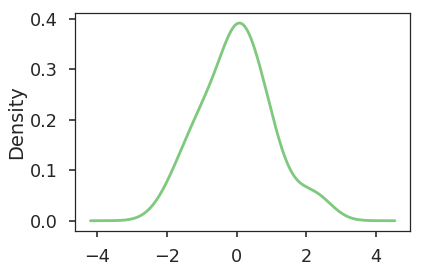

In [35]:
urban_municipalities['z_satisfaction'].plot(kind='density')

Como resultado, observamos que tenemos personas con valores negativos (bajo el promedio) y positivos (sobre el promedio). 

En la visualización podemos usar una escala de colores que permite _ver_ mejor esas diferencias:

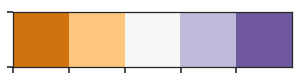

In [62]:
sns.palplot(sns.color_palette('PuOr', n_colors=5))

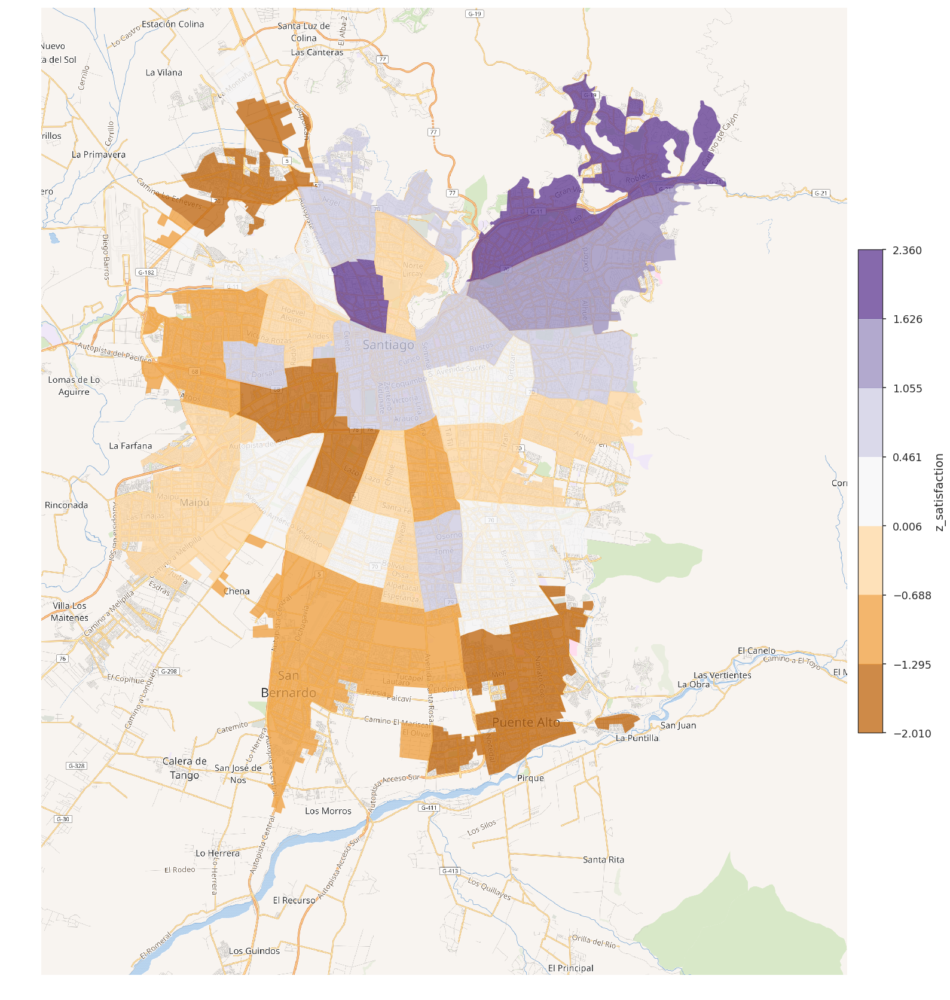

In [63]:
choropleth(urban_municipalities, figsize=28,  column='z_satisfaction', palette='PuOr', n_colors=7)

¿Encuentran algo inesperado en este mapa? Quienes sean de Santiago reconocerán que el mapa refleja la segregación económica de la ciudad, pero sorprendemente aparecen comunas felices a pesar de no tener altos ingresos. Independencia es una de ellas. ¿Por qué? Descubrir eso es un proyecto interesante :)

Respecto a los colores: este tipo de escalas, llamadas _divergentes_, nos muestran ambos extremos de un continuo. El color blanco representa las observaciones que son cercanas al promedio, mientras que un color (en este caso, púrpura) se asigna a las observaciones sobre él. La intensidad del color indica qué tan lejos llega. Del mismo modo, el color naranjo se utiliza para las observaciones bajo el promedio. 

Existen distintos tipos de paletas divergentes, y las veremos más adelante en una clase de visualización y uso de color. 

Sigamos analizando: al ver los mapas parece existir una correlación clara con el nivel de ingreso (variable `ytotcorh`). Exploremos esta variable en la CASEN:

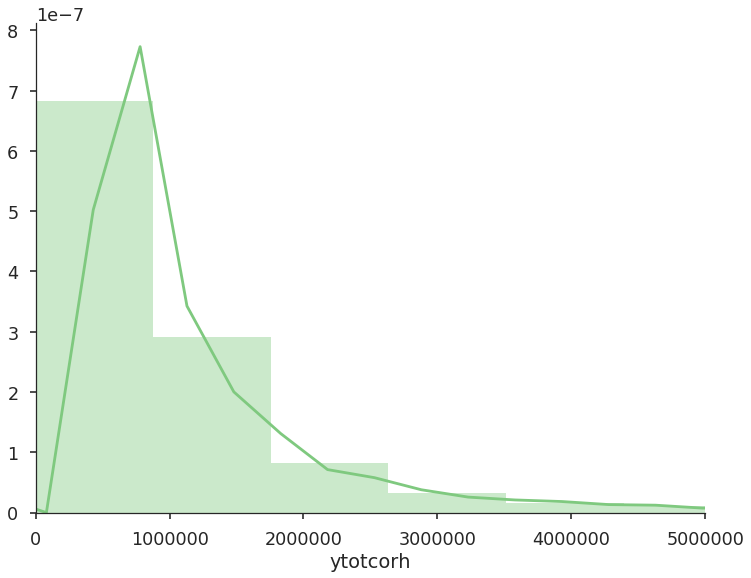

In [71]:
plt.figure(figsize=(12,9))
sns.distplot(casen['ytotcorh'])
# cortamos en 5 millones de pesos
plt.xlim([0, 5000000])
sns.despine()

In [72]:
casen['ytotcorh'].describe()

count    1.219700e+04
mean     1.105801e+06
std      1.354931e+06
min      0.000000e+00
25%      4.614330e+05
50%      7.312500e+05
75%      1.213333e+06
max      4.390000e+07
Name: ytotcorh, dtype: float64

La media de observaciones es aprox. 735000 pesos. Esto quiere decir que la mitad de la gente entrevistada en la encuesta gana menos de eso.

Veamos la distribución por comunas:

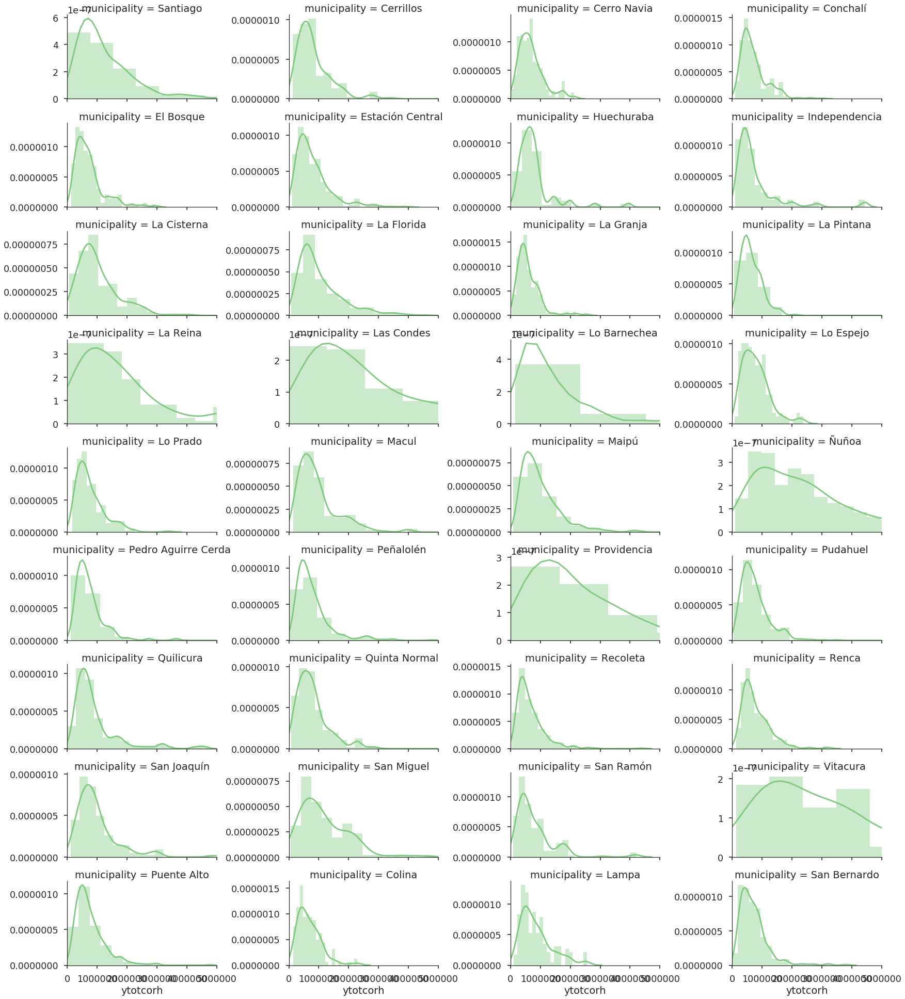

In [74]:
g = sns.FacetGrid(data=casen, col='municipality', col_wrap=4, aspect=2, size=3, sharey=False)
g.map(sns.distplot, 'ytotcorh', bins=20)
g.set(xlim=[0,5000000])

No hay grandes sorpresas en este gráfico.

Aunque no debemos olvidar que necesitamos hacer el mismo cálculo de expansión que hicimos para la satisfacción, de modo de poder construir un mapa de coropletas:

In [75]:
casen['adjusted_income'] = casen.ytotcorh * casen.expr
casen_municipality_income_exp = casen.groupby('municipality').aggregate({'expr': 'sum'})
income = casen.groupby('municipality').aggregate({'ytotcorh': 'sum', 'adjusted_income': 'sum'}).join(casen_municipality_income_exp)
income.head()

,adjusted_income,ytotcorh,expr
municipality,,,
Cerrillos,32595963674,147957764,37881
Cerro Navia,35731363402,228692320,52692
Colina,23280728406,102461713,29484
Conchalí,32270349912,208278030,46507
El Bosque,48034382914,219680291,61559


In [76]:
income['exp_income'] = income['adjusted_income'] / income['expr']

In [77]:
income.sort_values(by='exp_income')

,adjusted_income,ytotcorh,expr,exp_income
municipality,,,,
Recoleta,40094996439,230003060,64705,6.196584e+05
La Granja,33460339394,196694788,53238,6.285048e+05
Independencia,26766762473,121557039,42431,6.308303e+05
La Pintana,48357627646,261661249,72623,6.658721e+05
Cerro Navia,35731363402,228692320,52692,6.781174e+05
San Bernardo,75248660440,463364406,109020,6.902280e+05
Pudahuel,66630286928,343362031,96532,6.902404e+05
Conchalí,32270349912,208278030,46507,6.938816e+05
San Ramón,22530312713,151050915,30106,7.483662e+05


In [78]:
urban_municipalities = urban_municipalities.join(income['exp_income'], on='NOM_COM')

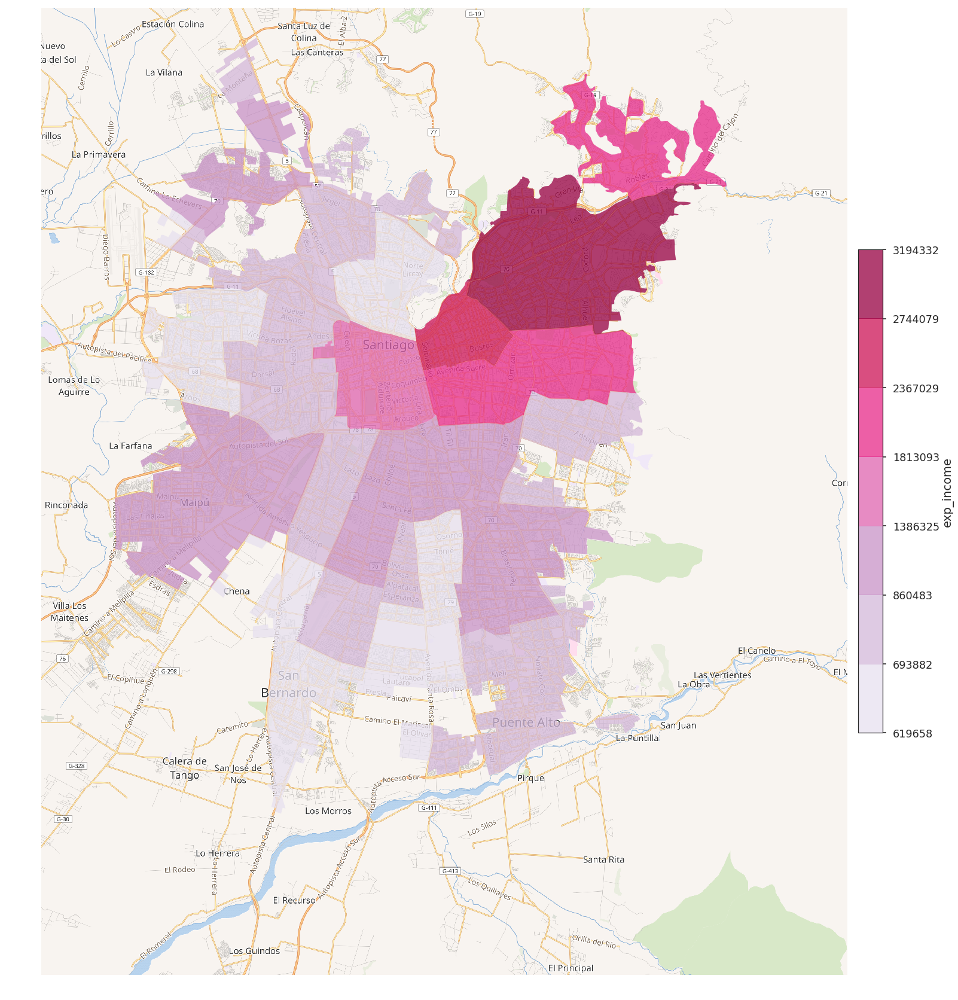

In [81]:
choropleth(urban_municipalities, figsize=28, column='exp_income', scheme='fisher_jenks', palette='PuRd', n_colors=7)

El mapa nos entrega resultados que son más o menos conocidos, y que se asemejan al mapa de ejemplo que vimos al inicio de este notebook.

Los mapas parecen confirmar que existe una correlación entre ingreso y satisfacción con la vida. Podemos formalizar este análisis utilizando el método `jointplot` de `seaborn`, que visualiza una posible correlación utilizando el [coeficiente de Pearson](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient):

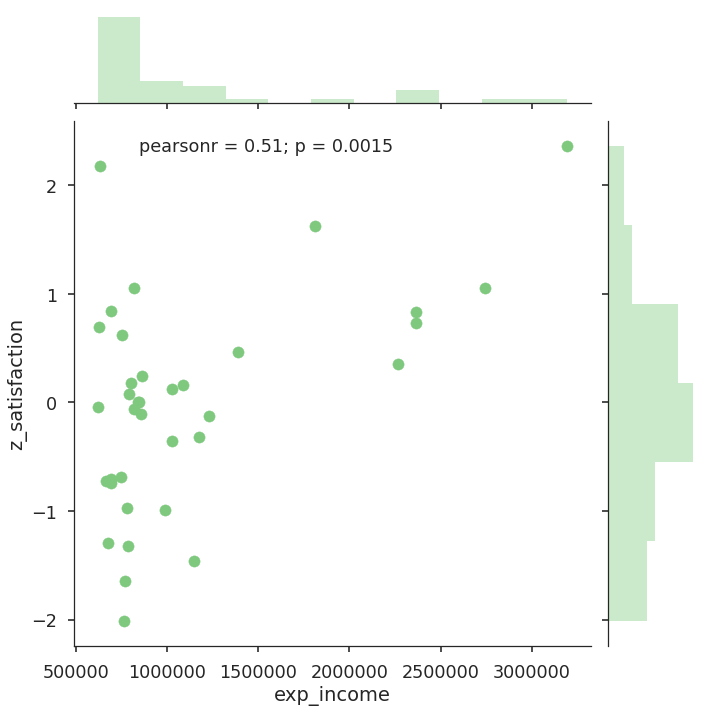

In [85]:
sns.jointplot('exp_income', 'z_satisfaction', urban_municipalities, size=10)

Efectivamente hay una correlación alta y significativa ($\rho = 0.51$). Sin embargo, vemos que la distribución de ingreso está sesgada a la izquierda (es decir, a ingresos más bajos). La correlación de Pearson asume variables con distribuciones normales.

Una alternativa es transformar la variable de ingreso utilizando escala logarítmica. Esto permite comparar los órdenes de magnitud de ingreso en vez del ingreso mismo. Lo podemos hacer así:

In [83]:
urban_municipalities['log_income'] = np.log(urban_municipalities['exp_income'])

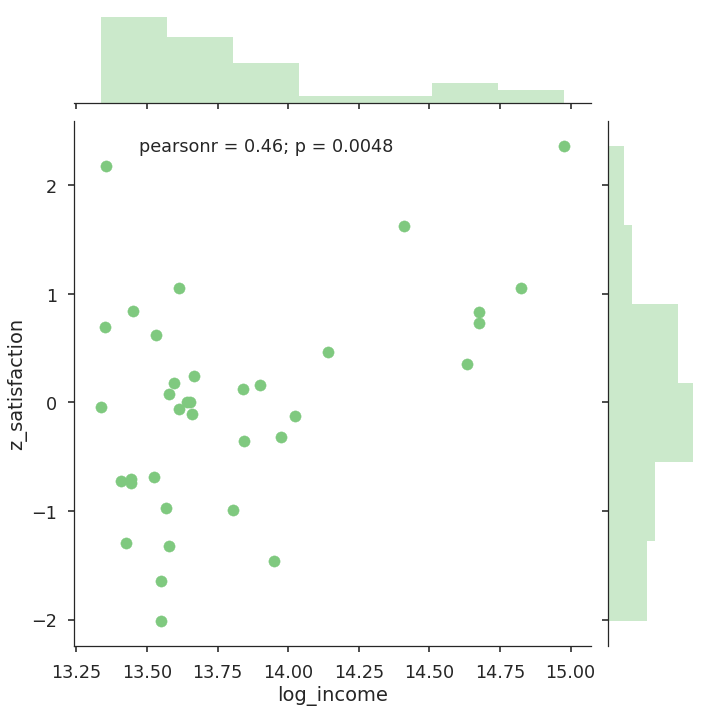

In [86]:
sns.jointplot('log_income', 'z_satisfaction', urban_municipalities, size=10)

La distribución está mejor, pero sigue sin respetar el requisito de normalidad (¿será una muestra de lo enormemente desigual que es nuestro país?). Sin embargo, la correlación se mantiene en una magnitud similar ($\rho = 0.46$), que todavía es relevante.

Otra alternativa es usar otra función de correlación. La alternativa más usada a la de Pearson es la de Spearman, que considera los _rankings_ de las variables, es decir, el orden de ellas y no sus magnitudes. En pocas palabras esto verifica qué tanto se parece un ranking de ingreso con un ranking de satisfacción:

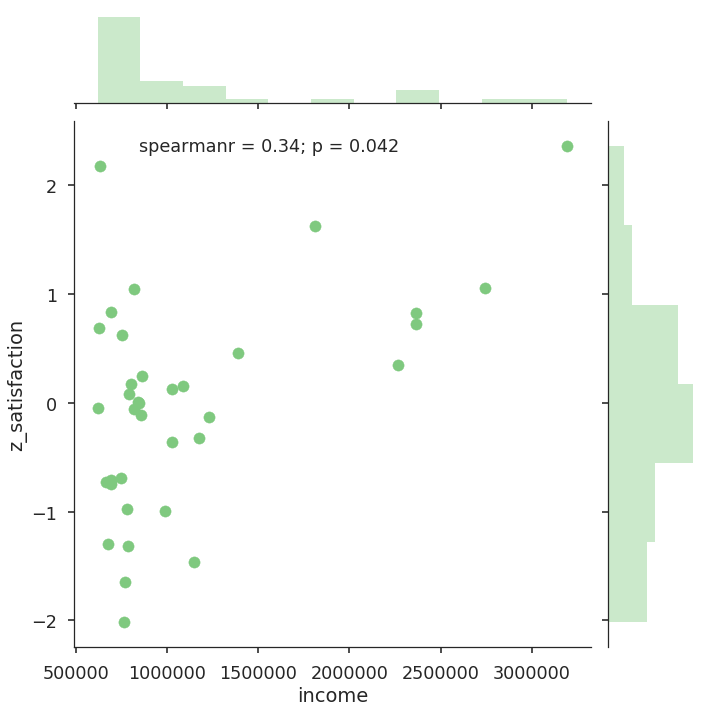

In [92]:
from scipy.stats import spearmanr
sns.jointplot('income', 'z_satisfaction', urban_municipalities, size=10, stat_func=spearmanr)

La correlación, a pesar de seguir siendo significativa, es bastante más baja, en el borde de la significancia ($p = 0.042$). ¿Qué pasa si evaluamos la correlación logarítmica?

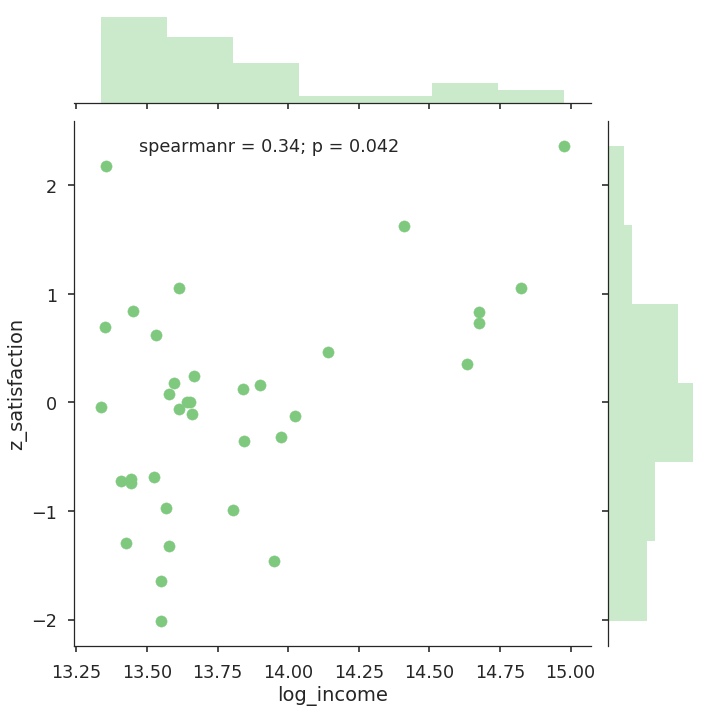

In [93]:
sns.jointplot('log_income', 'z_satisfaction', urban_municipalities, size=10, stat_func=spearmanr)

Observamos que el resultado es idéntico. Esto se debe a que la transformación logarítmica no altera el orden de las variables. 

Con esto concluimos este análisis. La correlación existe, sin embargo, explica muy poco respecto a la satisfacción. Es posible que mayor ingreso aumente las probabilidades de satisfacción con la vida a nivel comunal (no estamos analizando personas, sino poblaciones), y ciertamente no hay comunas insatisfechas con bajo ingreso, pero la correlación no es tan alta como esperaríamos si el ingreso fuese el único factor relevante.

Ciertamente hay mucho más por hacer. ¿Cómo sugieren continuar? Nos vemos en la próxima clase :)